In [1]:
from functions import *
from functions_new import *

import numpy as np
import os 

import matplotlib.pylab as plt
import matplotlib.patches as patches
from matplotlib.patches import Circle

import seaborn as sns
from seaborn import heatmap
from seaborn import kdeplot

from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.signal import savgol_filter

import SOAPify
from SOAPify import SOAPclassification, calculateTransitionMatrix, normalizeMatrixByRow, getSOAPSettings
import SOAPify.HDF5er as HDF5er

from MDAnalysis import Universe as mdaUniverse
from MDAnalysis import transformations
from MDAnalysis.tests.datafiles import TPR, XTC
from SOAPify.HDF5er import MDA2HDF5
from os import path
import hdbscan

from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import fcluster

/home/cristina/programs/SOAPify/latest_venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def signaltonoise(a, axis, ddof):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis = axis, ddof = ddof)
    return 20*np.log10(abs(np.where(sd == 0, 0, m / sd)))

In [3]:
XYZ_DIR = 'INPUT_files/Wave/'
XYZ_OUTDIR = 'Wave/'
NAME = 'wave_mod' # NAME.hdf5
# old_name_hdf5 = False  # if OLD hdf5 file already exists (created using OLD name for GROUP)
# OLD_NAME = "run_nopbc_eq"
# OLD_GROUP = "/Trajectories/"+OLD_NAME
GROUP = "/Trajectories/"+NAME
MASK = False #be sure that mask used to create .hdf5 is the same used here

LOAD_HDF5 = True 
LOAD_HDF5SOAP = True
LOAD_SOAP = True
LOAD_TimeSOAP = True
LOAD_LENS = True
dt = 1

TRJ_filename = NAME + ".xtc"  # or .lammpsdump 
TOP_filename = topo = NAME + ".gro"  # or .data

XYZ_ORIG = [0, 0, 0]
COFF=40  #be sure that is the same coff used to create soaps and lenses
window_length=2
polyorder = 2
wantedTrajectory = slice(0, None, None)
wantedUniverseAtoms = "type C"
INIT=0
END=311
STRIDE=1
analysed_window = 200

eq=0

SOAPnmax = 8
SOAPlmax = 8
SOAPatomMask = "C"

box_dimensions = [1000, 800, 800, 90, 90, 90]

In [4]:
u = mdaUniverse(XYZ_DIR+NAME+'.xyz')

transform = mda.transformations.boxdimensions.set_dimensions(box_dimensions)
u.trajectory.add_transformations(transform)

beads = u.select_atoms("all")

In [5]:
beads.write(XYZ_DIR+NAME+".gro")

/home/cristina/programs/SOAPify/latest_venv/lib/python3.8/site-packages/MDAnalysis/coordinates/GRO.py:421: UserWarning: Supplied AtomGroup was missing the following attributes: resnames. These will be written with default values. Alternatively these can be supplied as keyword arguments.
  warnings.warn(


In [6]:
with mda.Writer(XYZ_DIR+NAME+".xtc", beads.n_atoms) as w:
    for ts in u.trajectory:
        w.write(beads)

/home/cristina/programs/SOAPify/latest_venv/lib/python3.8/site-packages/MDAnalysis/coordinates/XTC.py:105: UserWarning: Reader has no dt information, set to 1.0 ps
  time = ts.time


In [7]:
# x_box = max(beads.atoms.positions[:, 0]) - min(beads.atoms.positions[:, 0])
# y_box = max(beads.atoms.positions[:, 1]) - min(beads.atoms.positions[:, 1])
# z_box = max(beads.atoms.positions[:, 2]) - min(beads.atoms.positions[:, 2])

## Create HDF5 File from TOP and TRJ files

In [8]:
if LOAD_HDF5:
    
    if MASK:
        HDF5_TRJ  = NAME + "mask.hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
    else:
        HDF5_TRJ  = NAME + ".hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
    
else:
    mycwd = os.getcwd()
    os.chdir(XYZ_DIR)
    createHDF5(TRJ_filename, TOP_filename, wantedUniverseAtoms, box_dimensions)  # Create HDF5 File (if not present)
    os.chdir(mycwd)
    
    if MASK:  # TODO: change HDF5 filename in mask.hdf5
        HDF5_TRJ  = NAME + "mask.hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
            
    else:
        HDF5_TRJ  = NAME + ".hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)

In [9]:
nAtoms = len(u.atoms)
windowToUSE = slice(eq+window_length // 2, -(window_length // 2))  # checked for both EVEN and ODD windows
windowToUSE_last = slice(eq+window_length // 2, -(window_length // 2+1))
analysed_windowToUSE = slice(eq+window_length // 2, -(len(u.trajectory)-analysed_window)-(window_length // 2)+1)

In [10]:
print(windowToUSE)
print(windowToUSE_last)
print(analysed_windowToUSE)

slice(1, -1, None)
slice(1, -2, None)
slice(1, -112, None)


## Create HDF5SOAP File

In [11]:
if LOAD_SOAP:
    pass

else:
    
    mycwd = os.getcwd()
    os.chdir(XYZ_DIR)
    prepareSOAP(HDF5_TRJ_nomask, NAME, COFF, SOAPnmax, SOAPlmax, SOAPatomMask)
    os.chdir(mycwd)

# 1. TimeSOAP

## Read TimeSOAP input

In [12]:
if LOAD_TimeSOAP:
    tsoap = np.load(XYZ_DIR+'time_dSOAP.npz')['name1']
    print(np.shape(tsoap))
else:

    if MASK:
        with h5py.File(XYZ_DIR+NAME+'.hdf5', 'r') as f:
            mask = f[GROUP+"Trajectory"][0, :, 2] > 12
        
        with h5py.File(XYZ_DIR+NAME+'soap.hdf5', 'r') as f:
            ds = f["SOAP/"+NAME]
            fillSettings = getSOAPSettings(ds)
            X = ds[:][:, mask]
        
    else: 
        with h5py.File(XYZ_DIR+NAME+'soap.hdf5', 'r') as f:
            ds = f["SOAP/"+NAME]
            fillSettings = getSOAPSettings(ds)
            X = ds[:, :, :]

    X = SOAPify.fillSOAPVectorFromdscribe(
            X[:], **fillSettings)
        

    X = SOAPify.normalizeArray(X)
    np.savez(XYZ_DIR+'X_normalized.npz', name1=X)
    
    v_soap = np.load(XYZ_DIR+'X_normalized.npz')['name1'][windowToUSE]
    print(np.shape(v_soap))
    
    nAtoms, tSOAP, dtSOAP = getTimeSOAP(XYZ_DIR+NAME+'soap.hdf5', NAME)   

(311, 6921)


In [13]:
nAtoms = np.shape(tsoap)[1]

In [14]:
tsoap_fl = np.array(tsoap).reshape(np.shape(tsoap)[0]*np.shape(tsoap)[1])
np.shape(tsoap_fl)

(2152431,)

In [15]:
np.save(XYZ_DIR+"tsoap_1stPART", tsoap[0:analysed_window, :])

In [16]:
# Analyse the 1st part of the trajectory (up to the wave passage)
tsoap = tsoap[0:analysed_window, :]

In [17]:
tsoap.shape

(200, 6921)

## Filtering

In [18]:
tSOAP_rolling = moving_average(np.array(tsoap).T, window_length)
min = np.min(tSOAP_rolling)
print(min)
max = np.max(tSOAP_rolling)
print(max)
tSOAP_rolling_norm = (tSOAP_rolling-min)/(max-min)  # NORMALIZATION
tr_tSOAP_rolling = np.array(tSOAP_rolling_norm).T
fl_tSOAP_rolling = np.reshape(tr_tSOAP_rolling, np.shape(tr_tSOAP_rolling)[0]*np.shape(tr_tSOAP_rolling)[1])

0.0
0.3511269343850397


In [19]:
dataToFit = transposeAndFlatten(tSOAP_rolling_norm)
print("minmax: ", np.min(dataToFit), np.max(dataToFit))

minmax:  0.0 1.0


In [20]:
savGolPrint = np.arange(tSOAP_rolling_norm.shape[1])

In [21]:
time = np.arange(savGolPrint[0]+window_length // 2 + 1, savGolPrint[-1]+window_length // 2 + 2 )
xticks = np.array(list(filter(lambda x: (x % 50 == 0), time)))

In [22]:
xticks

array([ 50, 100, 150, 200])

# 2. LENS

## LENS descriptor and filtering

In [23]:
if LOAD_LENS:
    LENS = np.load(XYZ_DIR+'lens.npy')
else:
    neigCounts = SOAPify.analysis.listNeighboursAlongTrajectory(universe, cutOff=COFF)
    LENS, nn, *_ = SOAPify.analysis.neighbourChangeInTime(neigCounts)
    np.save(XYZ_OUTDIR+"lens", LENS)

In [24]:
LENS.shape

(6921, 312)

In [25]:
# Remove the first frame (=0.0)
LENS = LENS[:, dt:]

In [26]:
np.save(XYZ_DIR+"lens_1stPART", LENS[:, 0:analysed_window])

In [27]:
# Analyse the 1st part of the trajectory
LENS = LENS[:, 0:analysed_window]

In [28]:
atom = nAtoms - 1

In [29]:
LENS_rolling = moving_average(LENS, window_length)
min = np.min(LENS_rolling)
print(min)
max = np.max(LENS_rolling)
print(max)
LENS_rolling_norm = (LENS_rolling-min)/(max-min)  # NORMALIZATION
tr_LENS_rolling = np.array(LENS_rolling_norm).T
fl_LENS_rolling = np.reshape(tr_LENS_rolling, np.shape(tr_LENS_rolling)[0]*np.shape(tr_LENS_rolling)[1])

0.0
0.12359550561797752


In [30]:
savGolPrint = np.arange(LENS_rolling_norm.shape[1])

In [31]:
LENS_rolling.shape

(6921, 199)

In [32]:
dataToFit = transposeAndFlatten(LENS_rolling_norm)
print("minmax: ", np.min(dataToFit), np.max(dataToFit))

minmax:  0.0 1.0


In [33]:
time = np.arange(savGolPrint[0]+window_length // 2 + 1, savGolPrint[-1]+window_length // 2 + 2 )
xticks = np.array(list(filter(lambda x: (x % 50 == 0), time)))

In [34]:
xticks

array([ 50, 100, 150, 200])

# 3. (LENS-TimeSOAP) LEAP descriptor

## 3.1 Stack descriptors and reshape

In [35]:
djoint_d = np.dstack((np.transpose(tSOAP_rolling_norm),np.transpose(LENS_rolling_norm)))

In [36]:
djoint_d_fl = np.array(djoint_d).reshape(np.shape(djoint_d)[0]*np.shape(djoint_d)[1],np.shape(djoint_d)[2])

In [37]:
djoint_d_fl.shape

(1377279, 2)

In [38]:
LEAP = []

for i in range(0, len(djoint_d_fl)):
    leap = np.sqrt(djoint_d_fl[i, 1]**2+djoint_d_fl[i, 0]**2)
    
    LEAP.append(leap)

In [39]:
ts_LEAP = np.array(LEAP).reshape(LENS_rolling_norm.shape[1], LENS_rolling_norm.shape[0])

In [40]:
ts_LEAP = ts_LEAP.transpose()

In [41]:
# TRJ to draw on to the scatter plot
all_trj = []
for particle in range(0, np.shape(djoint_d)[1]):
    trj = djoint_d[:, particle, :]
    all_trj.append(trj)

## Finding 2nd tSOAP peak 

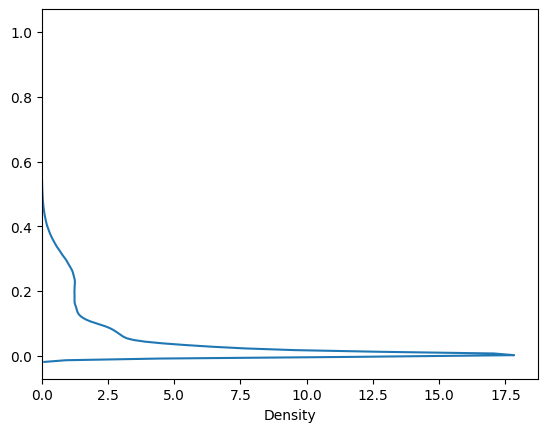

In [42]:
from scipy.signal import find_peaks

my_kde = sns.kdeplot(y=np.array(djoint_d_fl[:, 0]))
xdata = my_kde.lines[0].get_xdata() # Get the x data of the distribution
ydata = my_kde.lines[0].get_ydata() # Get the y data of the distribution
xy = [[xdata[i], ydata[i]] for i in range(len(xdata))]

# find peak
peak_coord = [xy[i] for i in find_peaks(xdata)[0]]
sorted_peak = sorted(peak_coord, key=lambda x: xdata[1])

# sort peak based on its `y` coord
sorted_peak.reverse()

In [43]:
y_between_peaks = []
x_between_peaks = []
for i in range(0, len(xy)):
    if sorted_peak[14][1] <= xy[i][1] <= sorted_peak[13][1]:
        x_between_peaks.append(xy[i][0])
        y_between_peaks.append(xy[i][1])

In [44]:
min_index = np.argmin(x_between_peaks)

In [45]:
tSOAP_peak_min = y_between_peaks[min_index]

## Finding 2nd LENS peak

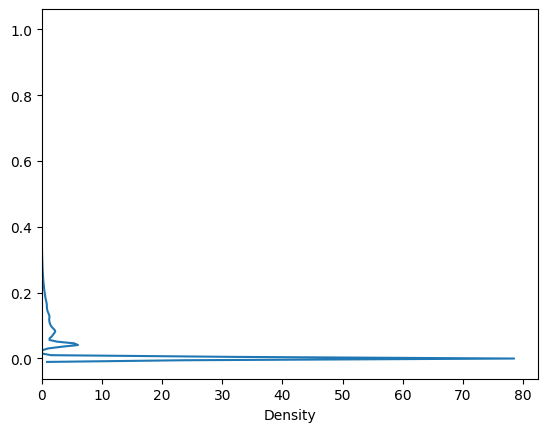

In [46]:
my_kde = sns.kdeplot(y=np.array(djoint_d_fl[:, 1]))
xdata = my_kde.lines[0].get_xdata() # Get the x data of the distribution
ydata = my_kde.lines[0].get_ydata() # Get the y data of the distribution
xy = [[xdata[i], ydata[i]] for i in range(len(xdata))]

# find peak
peak_coord = [xy[i] for i in find_peaks(xdata)[0]]
sorted_peak = sorted(peak_coord, key=lambda x: xdata[1])

# sort peak based on its `y` coord
sorted_peak.reverse()

In [47]:
y_between_peaks = []
x_between_peaks = []
for i in range(0, len(xy)):
    if sorted_peak[20][1] <= xy[i][1] <= sorted_peak[19][1]:
        x_between_peaks.append(xy[i][0])
        y_between_peaks.append(xy[i][1])

In [48]:
min_index = np.argmin(x_between_peaks)

In [49]:
LENS_peak_min = y_between_peaks[min_index]

In [50]:
tSOAP_peak_min_TOL = tSOAP_peak_min - 20*tSOAP_peak_min/100
tSOAP_peak_min_TOL

0.1350418937192

In [51]:
LENS_peak_min_TOL = LENS_peak_min - 20*LENS_peak_min/100
LENS_peak_min_TOL

0.044888814648242306

## Chi parameter

In [52]:
slope = np.empty((djoint_d.shape[1], djoint_d.shape[0]))
color_slope = np.empty((djoint_d.shape[1], djoint_d.shape[0]))
for frame in range(0, djoint_d.shape[0]):
    for particle in range(0, djoint_d.shape[1]):
        slope[particle][frame] = float((djoint_d[frame][particle][1]-djoint_d[frame][particle][0]) / (djoint_d[frame][particle][0]+djoint_d[frame][particle][1]))

/tmp/ipykernel_129233/196928963.py:5: RuntimeWarning: invalid value encountered in double_scalars
  slope[particle][frame] = float((djoint_d[frame][particle][1]-djoint_d[frame][particle][0]) / (djoint_d[frame][particle][0]+djoint_d[frame][particle][1]))


In [53]:
time = np.arange(0, djoint_d.shape[0])

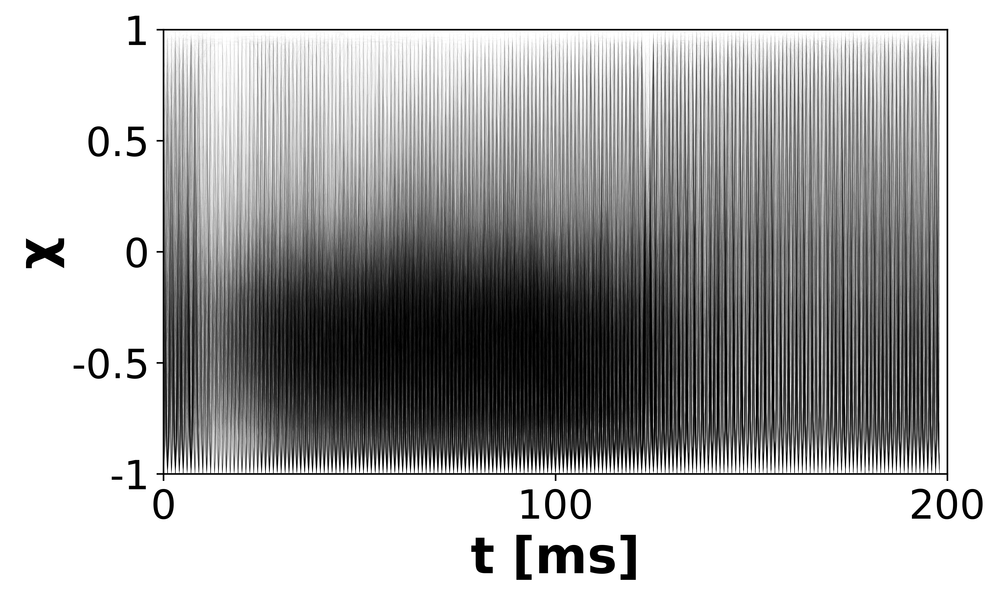

In [54]:
fig, axes = plt.subplots(
    1, figsize=(7, 4), dpi=500
)



for i in range(0, len(slope)):
    
    axes.plot(
        time,
        slope[i],
        color="black",
        linewidth=0.02,
        alpha=0.2,
    )
    
# axes.plot(
#         time,
#         slope[460],
#         color="magenta",
#         linewidth=1,
#         alpha=0.8,
#         label=r'ID 460'
#     )
    
    


axes.set_xlim(savGolPrint[0]+window_length // 2, savGolPrint[-1]+window_length // 2)
axes.set_xlabel(r't [ms]', weight = 'bold', size=25)
axes.set_xticks([0, 100, 200])
axes.set_xticklabels([0, 100, 200], fontsize=20)

axes.set_ylabel(r'χ', weight = 'bold', size=25)
axes.set_yticks([-1, -0.5, 0, 0.5, 1])
axes.set_yticklabels([-1, -0.5, 0, 0.5, 1], fontsize=20)
axes.set_ylim(-1, 1)



plt.subplots_adjust(wspace=0.08)

# Time coordination analysis

In [55]:
lag_time = []
particle_founded = []
init_frame_for_particle = []
for particle in range(0, slope.shape[0]):
    found_red = 0
    found_lblue = 0
    count_lblue = 0
    found_lag = 0
    frame_red = []
    frame_lblue = []
    for frame in range(0, slope.shape[1]):
        if djoint_d[frame][particle][1] > LENS_peak_min and djoint_d[frame][particle][0] < tSOAP_peak_min and count_lblue==0:
            found_red = 1
            frame_red.append(frame)

            
        if djoint_d[frame][particle][0] > tSOAP_peak_min and djoint_d[frame][particle][1] >= LENS_peak_min and found_red == 1:
            frame_lblue.append(frame)
                
            count_lblue = count_lblue + 1
        if djoint_d[frame][particle][0] <= tSOAP_peak_min:
            count_lblue = 0
            frame_lblue = []
            
        if count_lblue > 20 and found_lag == 0:
            lag_time.append(np.min(frame_lblue)-np.max(frame_red))
            particle_founded.append(particle)
            init_frame_for_particle.append(np.max(frame_red))
            found_lag = 1
                

In [56]:
import math
nonan_slope = np.empty((np.shape(slope)[0], np.shape(slope)[1]))
for p in range(0, np.shape(slope)[0]):
    for f in range(0, np.shape(slope)[1]):
        if math.isnan(slope[p][f]) == True:
            nonan_slope[p][f] = float(0)
        else:
            nonan_slope[p][f] = slope[p][f]

In [62]:
rephased_slope = []
count_reph = 0
for p in range(0, len(particle_founded)):
    particle = particle_founded[p]
#     print(particle)
    init_frame = init_frame_for_particle[p] 
#     first_frame = init_frame-1
#     if first_frame > 0:
#    new_slope_particle = np.concatenate(([mean_slop_before_fluct], slope[particle]))
#         rephased_slope.append(nonan_slope[particle][first_frame:])
#     else:
    rephased_slope.append(nonan_slope[particle][init_frame:])
    count_reph = count_reph + 1
#     if slope[particle][init_frame] > 0.5:
#         print('>0.5 is ', particle)
#     if particle == 106:
#         print('count_reph is ', count_reph)

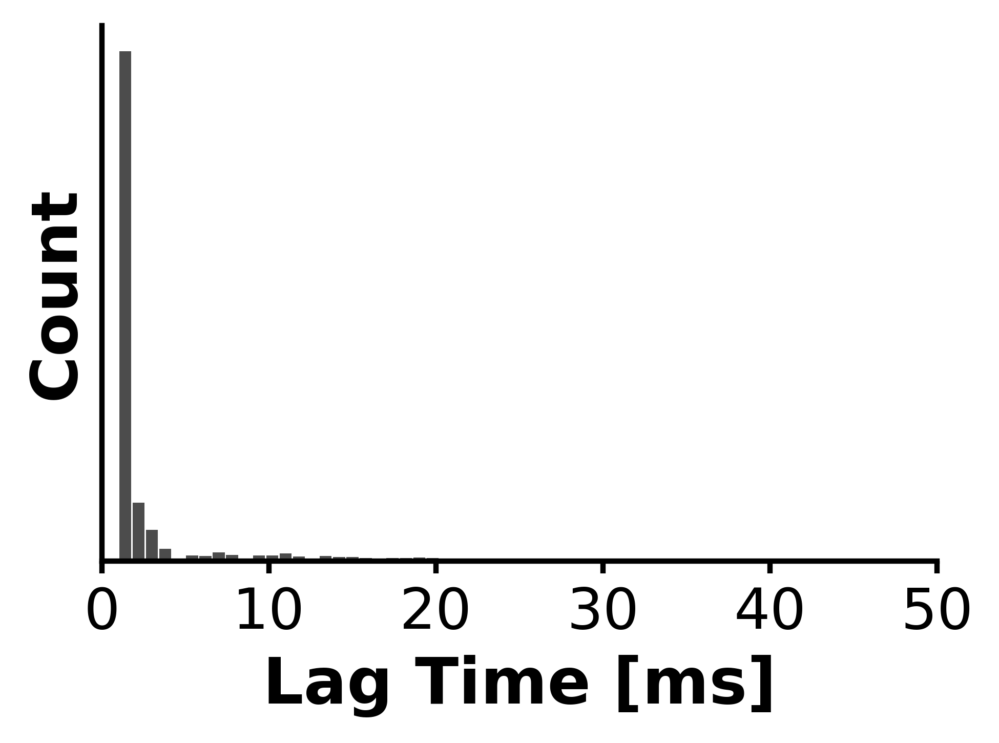

In [58]:
fig, ax = plt.subplots(1, figsize=(4,3), dpi=500, tight_layout=True)
# sns.kdeplot(data=distance, color='black', bw_adjust=0.4, linewidth=2, fill=False)

# ax.set_xlim(0, 1)
# ax.set_ylim(0, 4)
ax.set_xlabel('Lag Time [ms]', weight='bold', size=18)
ax.set_xticks([0, 10, 20, 30, 40, 50])
ax.set_xticklabels([0, 10, 20, 30, 40, 50], size=12)
ax.set_ylabel('Count', weight='bold', size=18)
ax.set_yticks([])

plt.hist(x=lag_time, bins=100, color='black',
                            alpha=0.7, rwidth=0.9)

ax.set_xlim(0, 50)
for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
    
ax.tick_params(
    axis='both',          # changes apply to the x-axis
    which='major',      # both major and minor ticks are affected
    bottom=True,
    left=True,      
    labelleft=True,
    labelbottom=True,
    width=1.5,
    labelsize=16,
) 
plt.savefig(XYZ_OUTDIR+'Figure/lagtime.png')

In [59]:
len(particle_founded)

2680

In [60]:
rephased_slope_fl = []
for p in range(0, len(rephased_slope)):
    for f in range(0, 51):
        rephased_slope_fl.append(rephased_slope[p][f])

In [61]:
time = np.arange(0, 21)

In [70]:
# MEAN CHI for the system
all_slope_val = []
for p in range(0, slope.shape[0]):
    for f in range(0, slope.shape[1]):
        if -1 <= slope[p][f] <= 1:
            all_slope_val.append(slope[p][f])

slope_mean = np.mean(all_slope_val)
print(slope_mean)

-0.7422173105444992


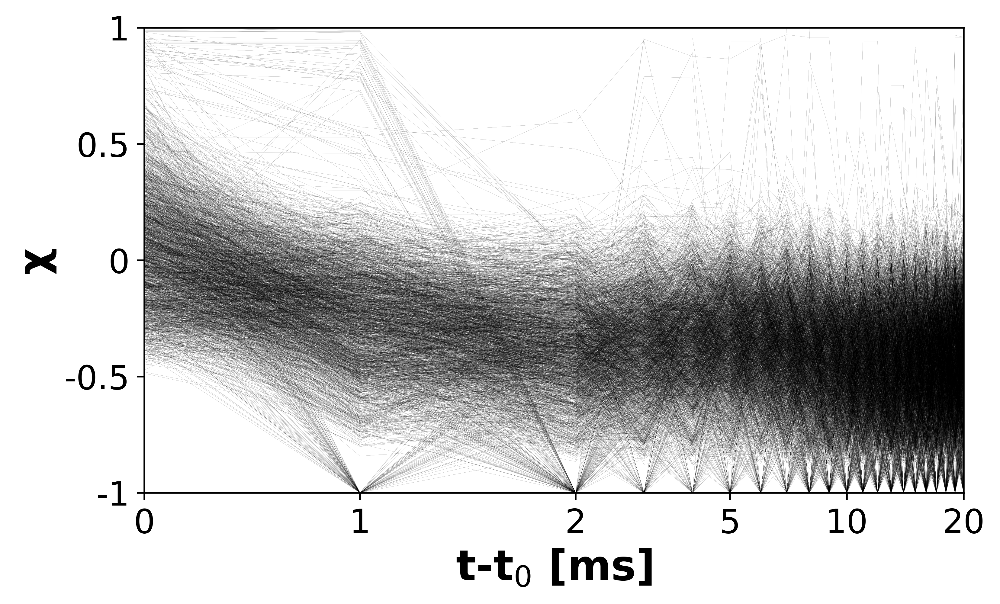

In [79]:
fig, axes = plt.subplots(1, figsize=(7,4), dpi=500)



for i in range(0, len(rephased_slope)):
    
    axes.plot(
        time,
        rephased_slope[i][0:21],
        color="black",
        linewidth=0.03,
        alpha=0.8,
    )
    
# axes.plot(
#         time,
#         rephased_slope[43][0:15],
#         color="lime",
#         linewidth=2,
#         alpha=1,
#     )  

plt.xscale('symlog')
axes.set_xlim(0, 20)
axes.set_xlabel(r't-t$_{0}$ [ms]', weight = 'bold', size=20)
axes.set_xticks([0, 1, 2, 5, 10, 20])
axes.set_xticklabels([0, 1, 2, 5, 10, 20], fontsize=16)

axes.set_ylabel(r'χ', weight = 'bold', size=20)
axes.set_yticks([-1, -0.5, 0, 0.5, 1])
axes.set_yticklabels([-1, -0.5, 0, 0.5, 1], fontsize=16)
axes.set_ylim(-1, 1)

# axes.axvline(x=1, linewidth=3, linestyle='--', color='cadetblue')


plt.subplots_adjust(wspace=0.08)
plt.savefig(XYZ_OUTDIR+'Figure/CHIparameter.png', bbox_inches='tight')